In [ ]:
from google.colab import files
files.upload() # Upload mltools.zip
!unzip -q mltools.zip
%cd mltools

Saving mltools.zip to mltools.zip
/content/mltools


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## **Problem 1: Logistic Regression**

We’ll start by building two binary classification problems, one separable and the other not

In [ ]:
from logisticClassify2 import logisticClassify2
import numpy as np
import mltools as ml
import matplotlib.pyplot as plt


In [ ]:
iris = np.genfromtxt("data/iris.txt",delimiter=None)
X, Y = iris[:,0:2], iris[:,-1] # get first two features & target
X,Y = ml.shuffleData(X,Y) # reorder randomly (important later)
X,_ = ml.transforms.rescale(X) # works much better on rescaled data
XA, YA = X[Y<2,:], Y[Y<2] # get class 0 vs 1
XB, YB = X[Y>0,:], Y[Y>0] # get class 1 vs 2


Note: The code uses numpy’s permute to iterate over data randomly; should avoid issues due to the default order of the data (by class). Similarly, rescaling and centering the data may help speed up convergence as well.

1. To show the two classes in a scatter plot (one for each data set) and verify that one data set is linearly separable
while the other is not

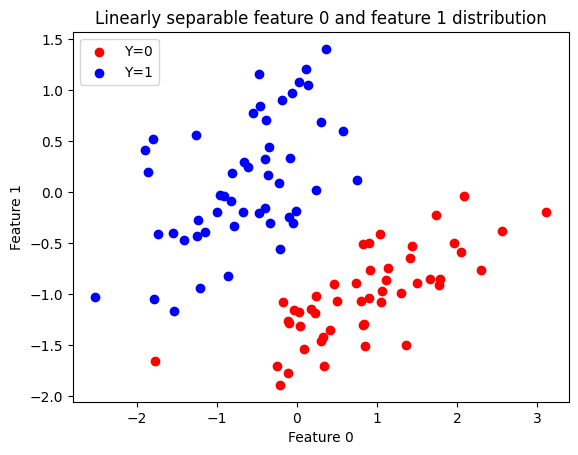

In [ ]:
color=['red','blue']

for i in range(2):
  indices=np.where(YA==i)
  plt.scatter(XA[indices,0],XA[indices,1],c=color[i],label="Y="+str(i))

plt.title("Linearly separable feature {} and feature {} distribution".format(0,1))
plt.xlabel("Feature {}".format(0))
plt.ylabel("Feature {}".format(1))
plt.legend(loc="upper left")
plt.show()

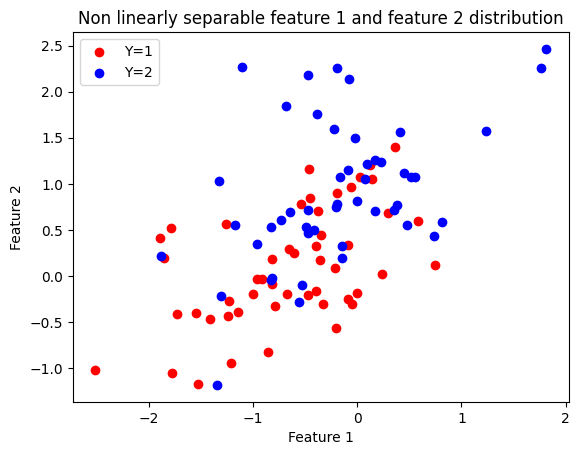

In [ ]:
color=['red','blue']

for i in range(1,3):
  indices=np.where(YB==i)
  plt.scatter(XB[indices,0],XB[indices,1],c=color[i-1],label="Y="+str(i))

plt.title("Non linearly separable feature {} and feature {} distribution".format(1,2))
plt.xlabel("Feature {}".format(1))
plt.ylabel("Feature {}".format(2))
plt.legend(loc="upper left")
plt.show()

2. The function plotBoundary in logisticClassify2.py to compute the points on the decision boundary. In particular, you only need to make sure x2b is set correctly using self.theta . This will plot the data & boundary quickly, which is useful for visualizing the model during training. To demo the
function plot the decision boundary corresponding to the classifier sign(.5 − .25x1 + 1x2) along with the A data, and again with the B data; these fixed parameters will look like an OK classifier on one data set, but a
poor classifier on the other.

In [ ]:
def plotBoundary(self,X,Y):
        """ Plot the (linear) decision boundary of the classifier, along with data """
        if len(self.theta) != 3: raise ValueError('Data & model must be 2D');
        ax = X.min(0),X.max(0); ax = (ax[0][0],ax[1][0],ax[0][1],ax[1][1]);
        ## TODO: find points on decision boundary defined by theta0 + theta1 X1 + theta2 X2 == 0
        x1b = np.array([ax[0],ax[1]]);  # at X1 = points in x1b
        x2b = -((self.theta[0]+x1b*(self.theta[1]))/self.theta[2])      # TODO find x2 values as a function of x1's values
        ## Now plot the data and the resulting boundary:
        A = Y==self.classes[0]; # and plot it:
        plt.plot(X[A,0],X[A,1],'b.',X[~A,0],X[~A,1],'r.',x1b,x2b,'k-'); plt.axis(ax); plt.draw();

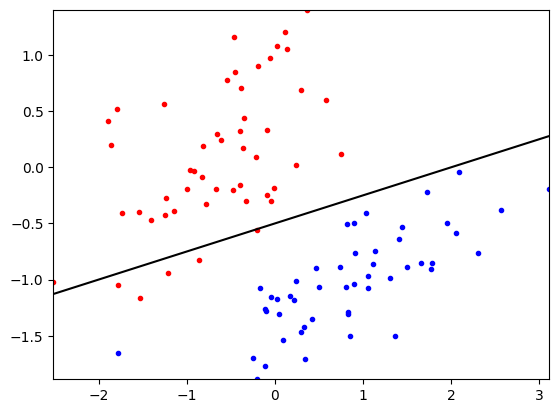

In [ ]:
classifierA=logisticClassify2()
classifierA.classes=np.unique(YA)
classifierA.theta=np.array([0.5,-0.25,1])
classifierA.plotBoundary(XA,YA)


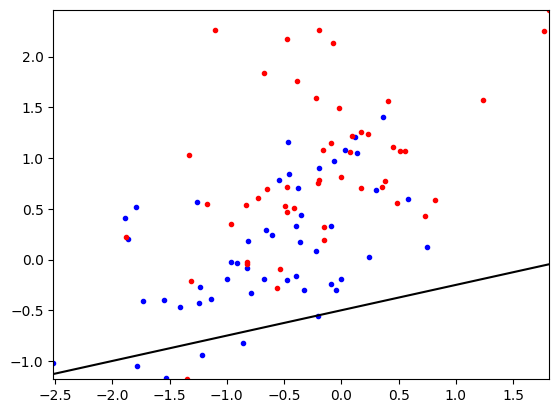

In [ ]:
classifierB=logisticClassify2()
classifierB.classes=np.unique(YB)
classifierB.theta=np.array([0.5,-0.25,1])
classifierB.plotBoundary(XB,YB)

3. The logisticClassify2.predict function to make predictions for your classifier.

In [ ]:
def predict(self, X):
        """ Return the predictied class of each data point in X"""

        Yhat=np.array([0 for i in range(len(X))])
        r=np.array([0.0 for i in range(len(X))])
        ## TODO: compute linear response r[i] = theta0 + theta1 X[i,1] + theta2 X[i,2] + ... for each i
        for i in range(len(X)):
          r[i]=self.theta[0]+self.theta[1]*X[i,0]+self.theta[2]*X[i,1]

        ## TODO: if z[i] > 0, predict class 1:  Yhat[i] = self.classes[1]
        ##       else predict class 0:  Yhat[i] = self.classes[0]
          if r[i]>0:
            Yhat[i]=self.classes[1]
          else:
            Yhat[i]=self.classes[0]
        return Yhat


In [ ]:
classifierA.predict(XA)
erA=classifierA.err(XA, YA)
print(erA)


0.050505050505050504


In [ ]:
classifierB.predict(XB)
erB=classifierB.err(XB, YB)
print(erB)


0.46464646464646464


4. Verified that the predict code matches the boundary plot by using plotClassify2D with the manually constructed learner on the two data sets. This will call predict on a dense grid of points, the resulting decision boundary matches the one you computed analytically.

/content/mltools/plot.py:61: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.
  axis.plot( X[Y==c,0],X[Y==c,1], 'ko', color=cmap(cvals[i]), **kwargs )


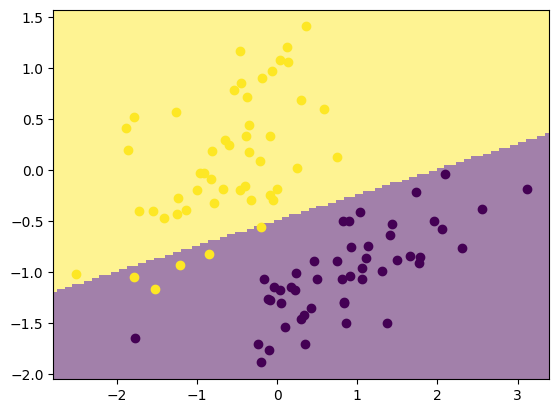

In [ ]:
ml.plotClassify2D(classifierA,XA,YA)
plt.show()

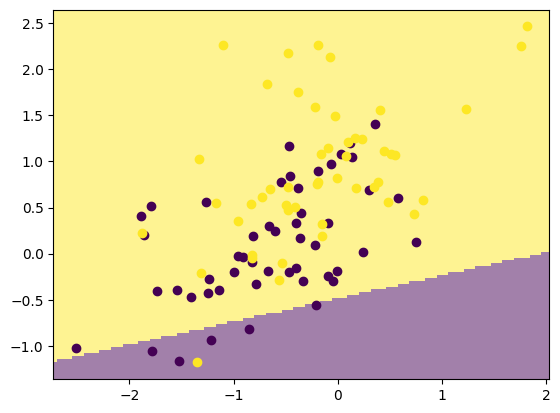

In [ ]:
ml.plotClassify2D(classifierB,XB,YB)
plt.show()

6. Train function to perform stochastic gradient descent on the logistic loss function. This will
require that :
(1) computing the surrogate loss function at each epoch (J =
1
m
PJj , from the previous part);
(2) computing the response (r
(j) and gradient associated with each data point x
(j)
, y(j)
;
(3) a stopping criterion consisting of two conditions (stop when either you have reached stopEpochs epochs
or J has not changed by more than stopTol since the last epoch).


In [ ]:
def train(self, X, Y, initStep=1.0, stopTol=1e-4, stopEpochs=5000, plot=None):
        """ Train the logistic regression using stochastic gradient descent """
        M,N = X.shape;                     # initialize the model if necessary:
        self.classes = np.unique(Y);       # Y may have two classes, any values
        XX = np.hstack((np.ones((M,1)),X)) # XX is X, but with an extra column of ones
        YY = ml.toIndex(Y,self.classes);   # YY is Y, but with canonical values 0 or 1
        if len(self.theta)!=N+1: self.theta=np.random.rand(N+1);
        # init loop variables:
        epoch=0; done=False; Jnll=[]; J01=[];
        while not done:
            stepsize, epoch = initStep*2.0/(2.0+epoch), epoch+1; # update stepsize
            # Do an SGD pass through the entire data set:
            for i in np.random.permutation(M):
                ri    = XX[i].dot(self.theta)     # TODO: compute linear response r(x)
                sigmoid = 1/(1+np.exp(-ri))
                gradi = -(1-sigmoid)*XX[i,:] if YY[i] else sigmoid*XX[i,:]     # TODO: compute gradient of NLL loss
                self.theta -= stepsize * gradi;  # take a gradient step

            J01.append( self.err(X,Y) )  # evaluate the current error rate

            ## TODO: compute surrogate loss (logistic negative log-likelihood)
            ##  Jsur = sum_i [ (log si) if yi==1 else (log(1-si)) ]
            Sigmoid = 1./(1.+np.exp(-(XX.dot(self.theta))))
            Jsur = -np.mean(YY*np.log(Sigmoid)+(1-YY)*np.log(1-Sigmoid))


            Jnll.append( Jsur ) # TODO evaluate the current NLL loss
            plt.figure(1); plt.plot(Jnll,'b-',J01,'r-'); plt.draw();    # plot losses
            if N==2: plt.figure(2); self.plotBoundary(X,Y); plt.draw(); # & predictor if 2D
            plt.pause(.01);                    # let OS draw the plot

            ## For debugging: you may want to print current parameters & losses
            # print self.theta, ' => ', Jnll[-1], ' / ', J01[-1]
            # raw_input()   # pause for keystroke

            # TODO check stopping criteria: exit if exceeded # of epochs ( > stopEpochs)
            done = epoch>=stopEpochs or (epoch>1 and abs(Jnll[-1]-Jnll[-2])<stopTol)  # or if Jnll not changing between epochs ( < stopTol )

7. Training for logistic regression classifier on both data sets (A and B). Described the parameter choices
for each dataset (stepsize, etc.) and included plots showing the convergence of the surrogate loss and error rate
(e.g., the loss values as a function of epoch during gradient descent), and the final converged classifier with
the data (the included train function does that  already).

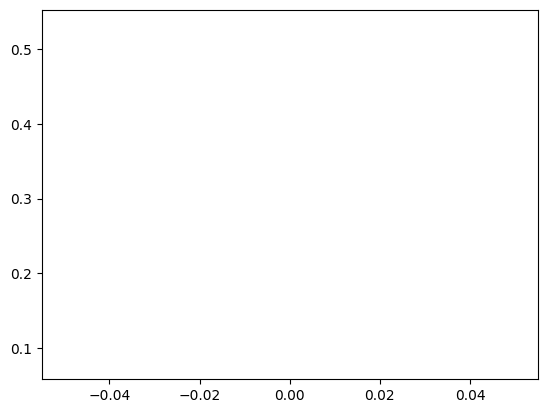

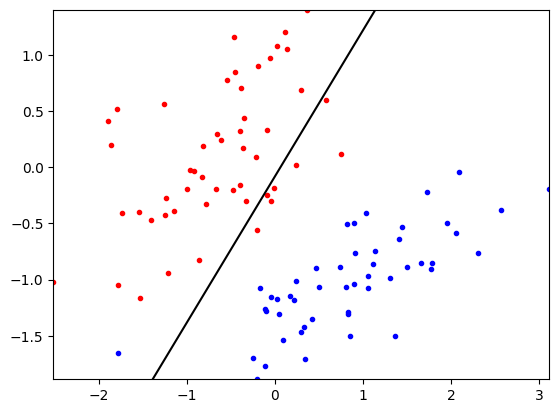

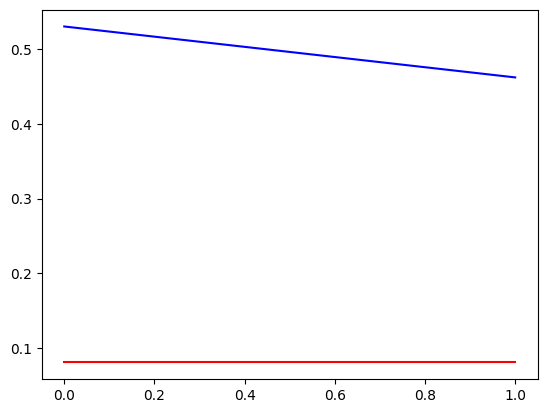

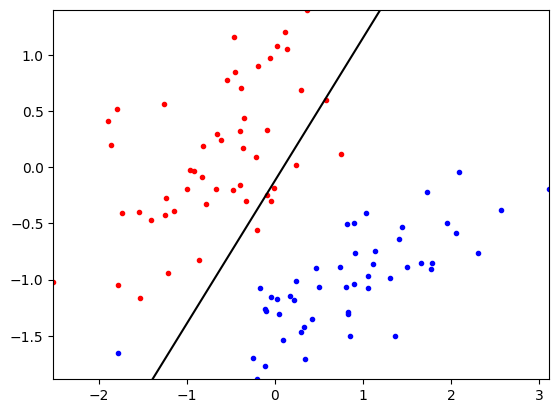

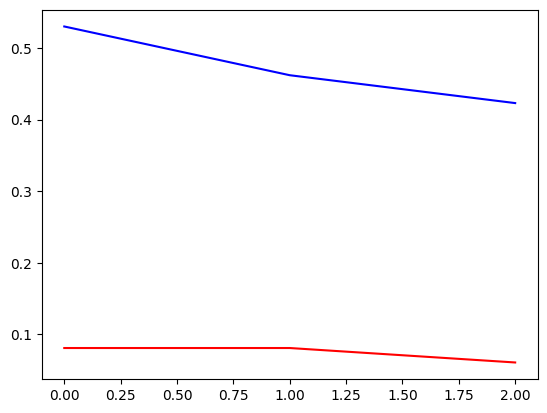

...

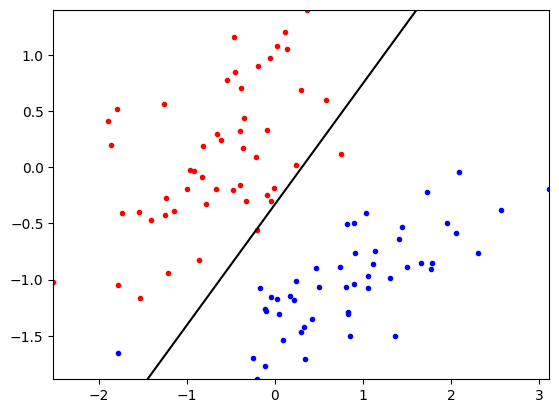

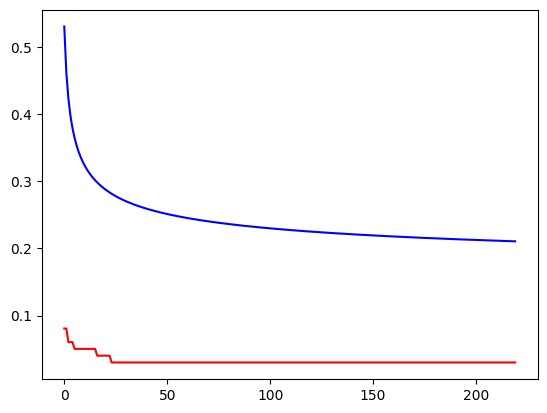

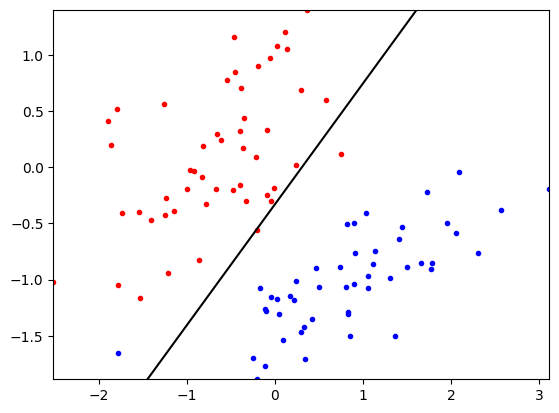

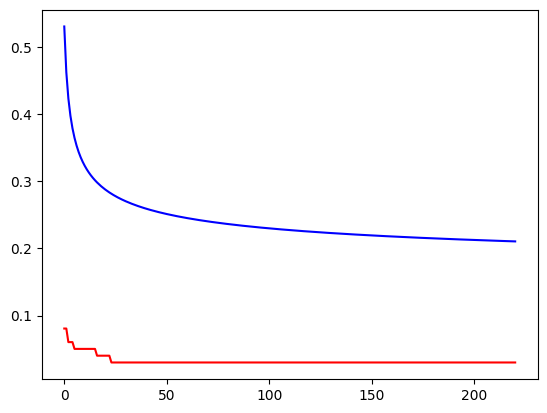

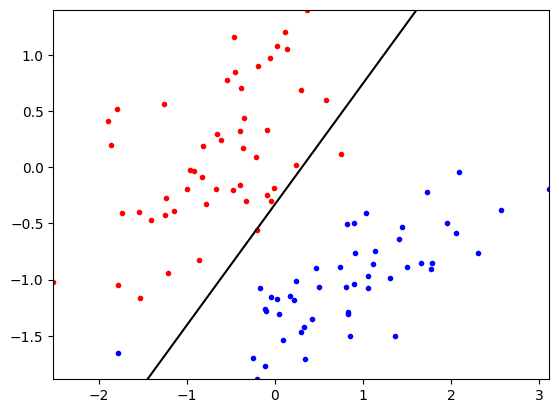

In [ ]:
classifierA.theta = np.array([0.,0.,0.]);
classifierA.train(XA,YA,initStep=0.01,stopEpochs=1000,stopTol=1e-4)


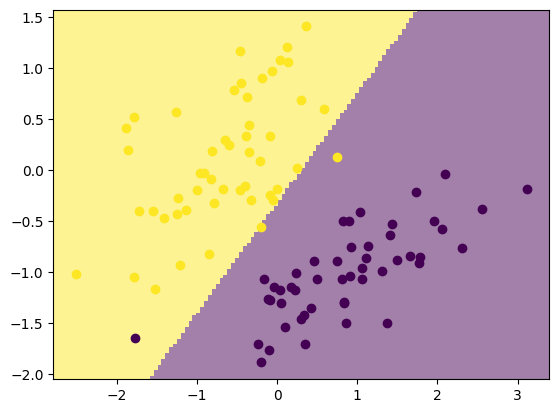

Training error rate:  0.030303030303030304


In [ ]:
ml.plotClassify2D(classifierA,XA,YA)
print("Training error rate: ",classifierA.err(XA,YA))
plt.show()

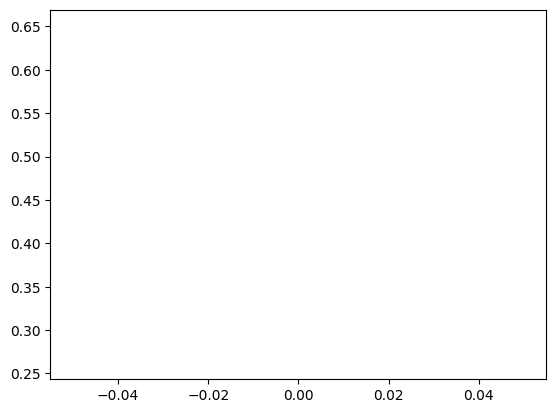

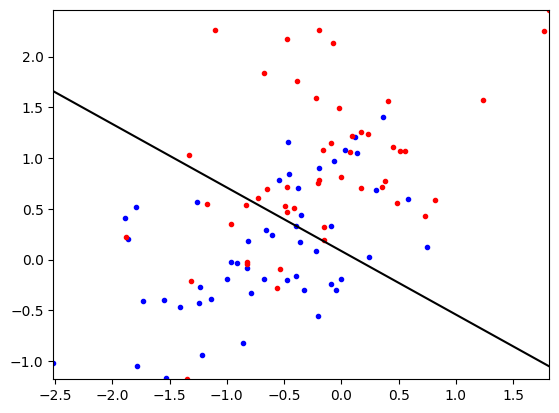

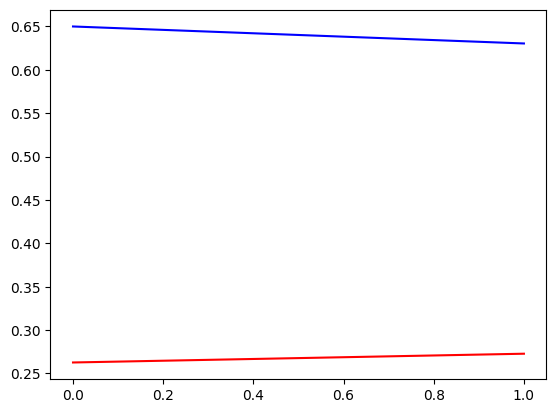

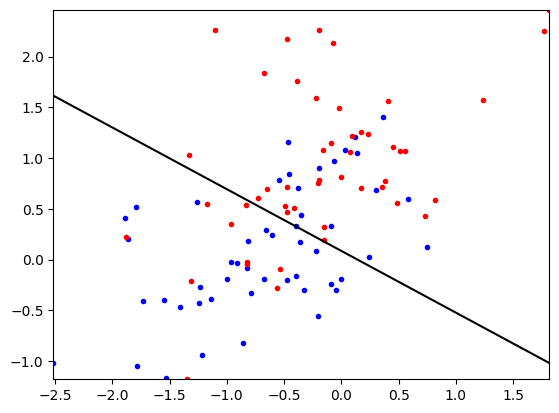

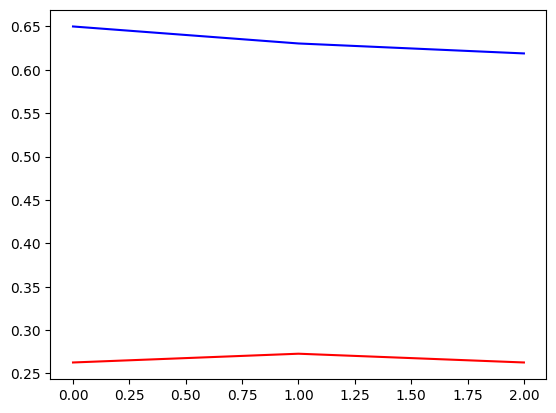

...

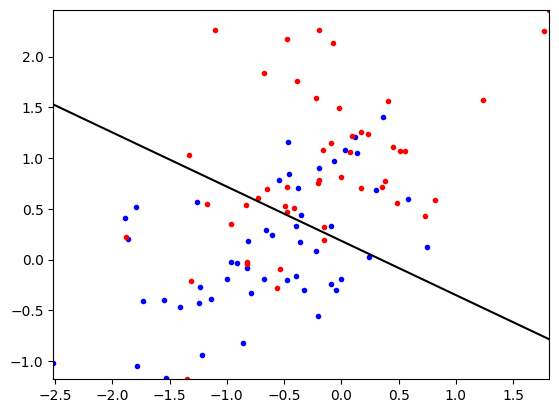

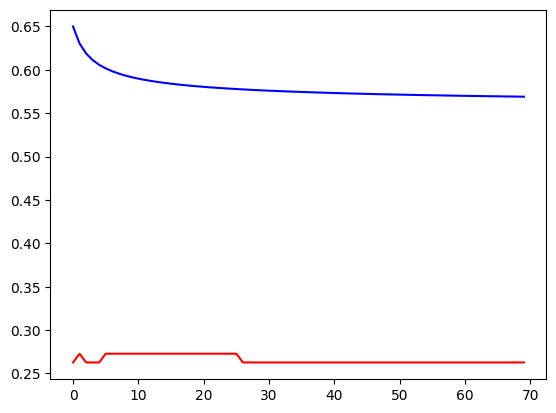

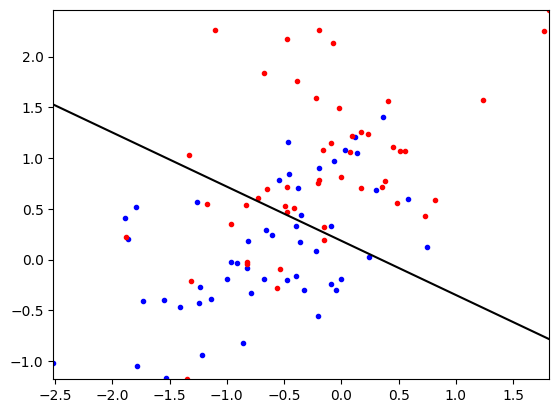

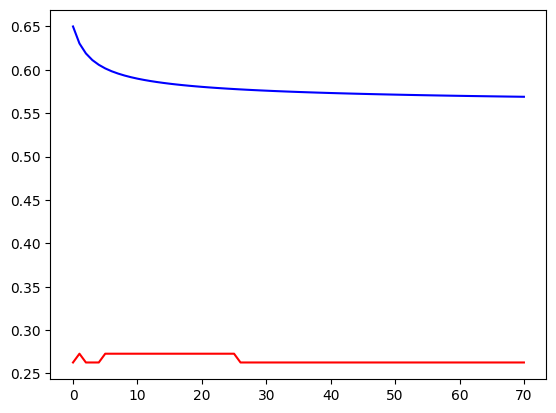

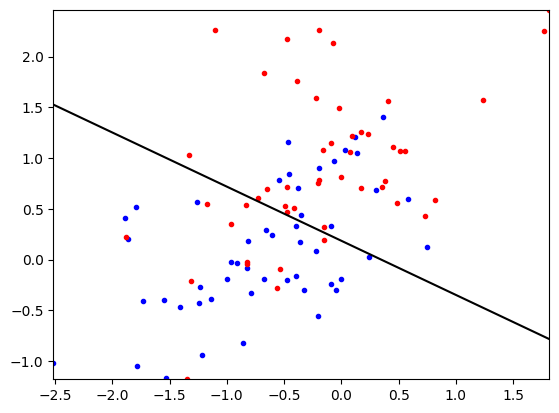

In [ ]:
classifierB.theta = np.array([0.,0.,0.]);
classifierB.train(XB,YB,initStep=0.01,stopEpochs=1000,stopTol=1e-4)



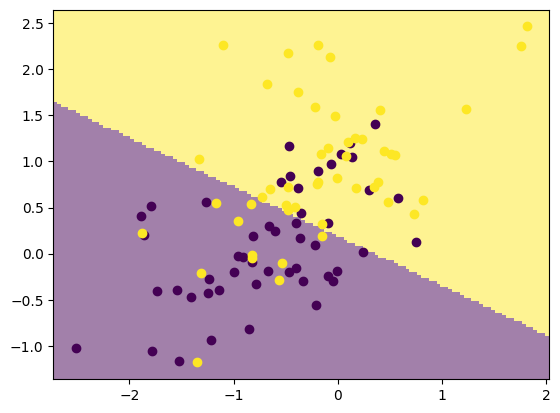

Training error rate:  0.26262626262626265


In [ ]:
ml.plotClassify2D(classifierB,XB,YB)
print("Training error rate: ",classifierB.err(XB,YB))
plt.show()

8. Added an L1 regularization term (+α
P
i
|θi
|) to the surrogate loss function, and updated the gradient

The L1 regularization term (+α P i |θi |) is added to the surrogate loss function and the gradient of the regularization term is αsign(θi)

In [ ]:
def train(self, X, Y, initStep=1.0, stopTol=1e-4, stopEpochs=5000,alpha=0., plot=None):
        """ Train the logistic regression using stochastic gradient descent """
        M,N = X.shape;                     # initialize the model if necessary:
        self.classes = np.unique(Y);       # Y may have two classes, any values
        XX = np.hstack((np.ones((M,1)),X)) # XX is X, but with an extra column of ones
        YY = ml.toIndex(Y,self.classes);   # YY is Y, but with canonical values 0 or 1
        if len(self.theta)!=N+1: self.theta=np.random.rand(N+1);
        # init loop variables:
        epoch=0; done=False; Jnll=[]; J01=[];
        while not done:
            stepsize, epoch = initStep*2.0/(2.0+epoch), epoch+1; # update stepsize
            # Do an SGD pass through the entire data set:
            for i in np.random.permutation(M):
                ri    = XX[i].dot(self.theta)     # TODO: compute linear response r(x)
                sigmoid = 1/(1+np.exp(-ri))
                gradi = -(1-sigmoid)*XX[i,:] if YY[i] else sigmoid*XX[i,:]     # TODO: compute gradient of NLL loss
                gradi += alpha * np.sign(self.theta)  # Added L1 regularization to the gradient
                self.theta -= stepsize * gradi;  # take a gradient step

            J01.append( self.err(X,Y) )  # evaluate the current error rate

            ## TODO: compute surrogate loss (logistic negative log-likelihood)
            ##  Jsur = sum_i [ (log si) if yi==1 else (log(1-si)) ]
            Sigmoid = 1./(1.+np.exp(-(XX.dot(self.theta))))
            Jsur = -np.mean(YY*np.log(Sigmoid)+(1-YY)*np.log(1-Sigmoid))
            Jsur += alpha * np.sum(np.abs(self.theta))  # Added L1 regularization to the loss function


            Jnll.append( Jsur ) # TODO evaluate the current NLL loss
            plt.figure(1); plt.plot(Jnll,'b-',J01,'r-'); plt.draw();    # plot losses
            if N==2: plt.figure(2); self.plotBoundary(X,Y); plt.draw(); # & predictor if 2D
            plt.pause(.01);                    # let OS draw the plot

            ## For debugging: you may want to print current parameters & losses
            # print self.theta, ' => ', Jnll[-1], ' / ', J01[-1]
            # raw_input()   # pause for keystroke

            # TODO check stopping criteria: exit if exceeded # of epochs ( > stopEpochs)
            done = epoch>=stopEpochs or (epoch>1 and abs(Jnll[-1]-Jnll[-2])<stopTol)  # or if Jnll not changing between epochs ( < stopTol )


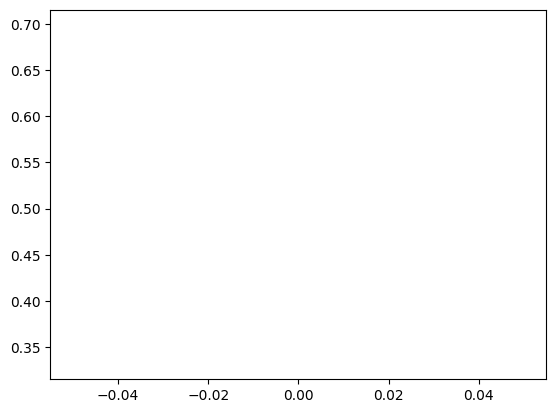

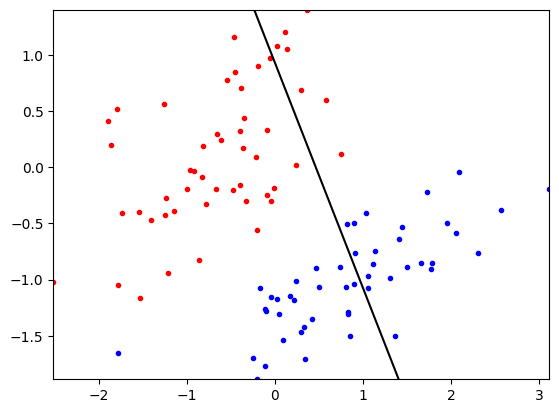

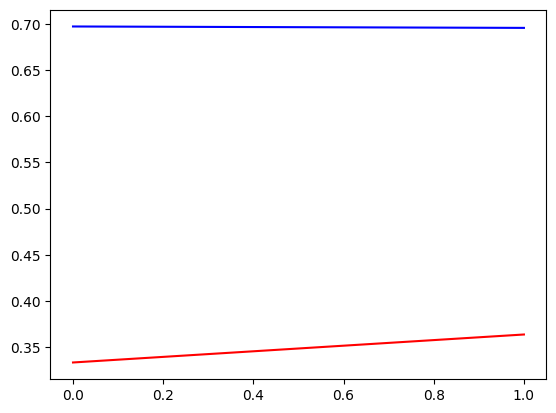

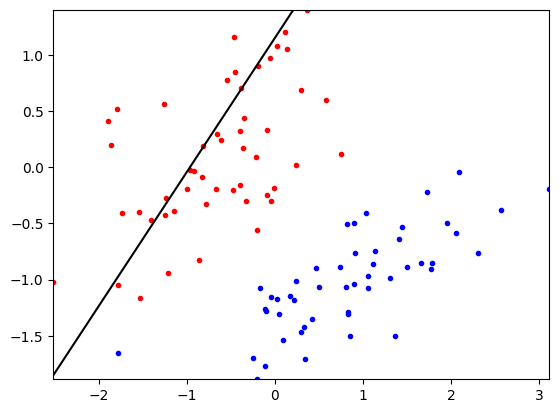

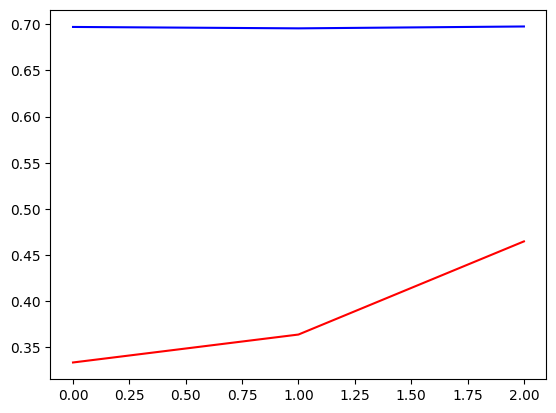

...

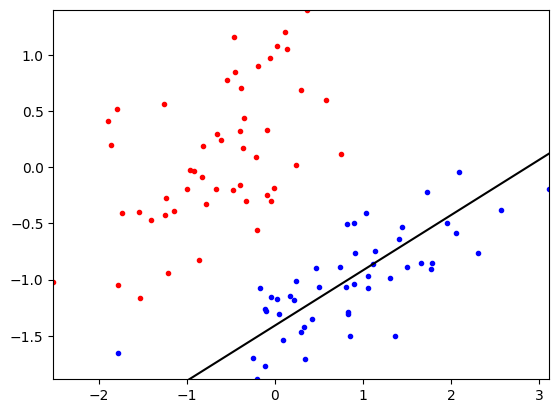

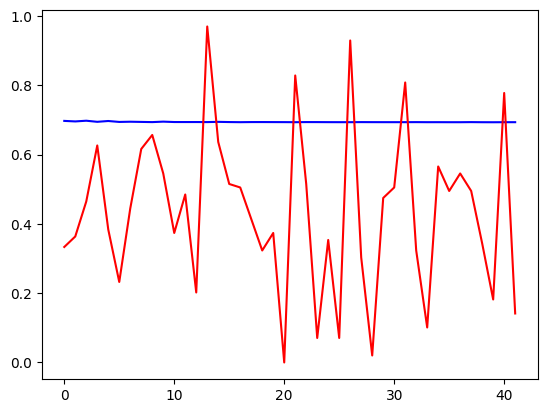

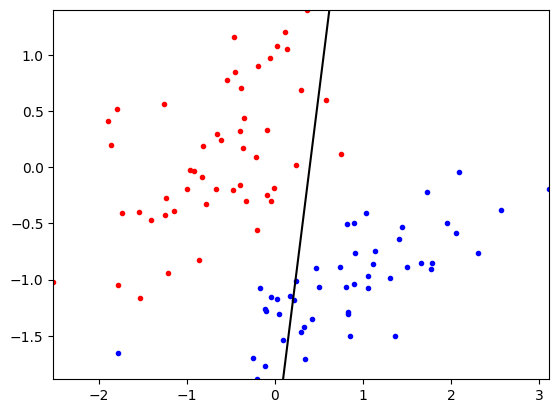

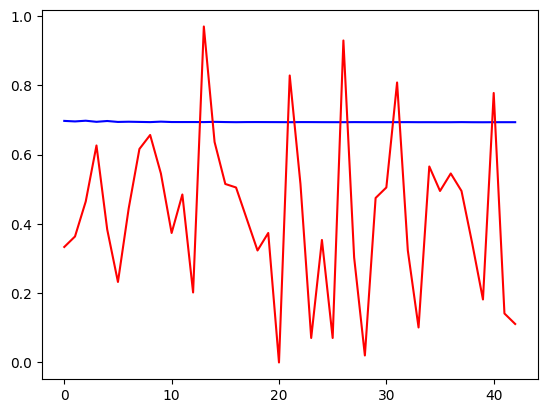

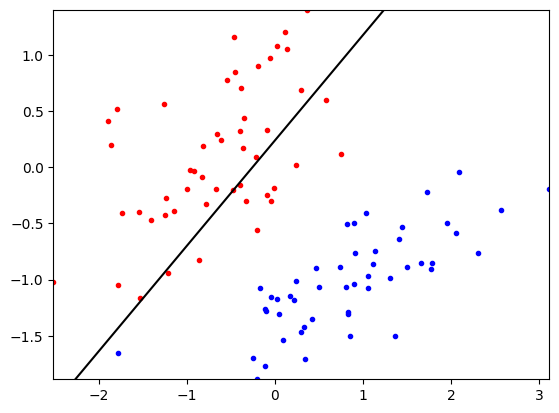

In [ ]:
classifierA.theta = np.array([0.,0.,0.]);
classifierA.train(XA,YA,initStep=1e-3,stopEpochs=2500,stopTol=1e-5,alpha=2)

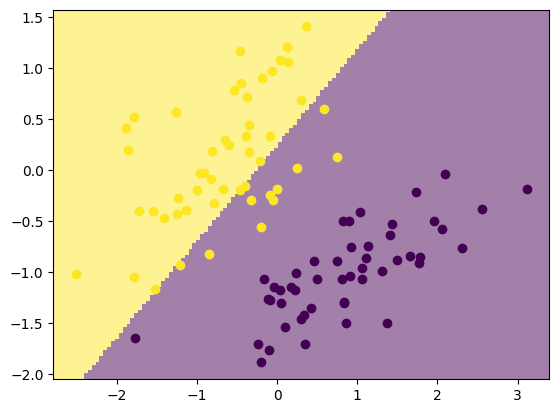

Training error rate:  0.1111111111111111


In [ ]:
ml.plotClassify2D(classifierA,XA,YA)
print("Training error rate: ",classifierA.err(XA,YA))
plt.show()

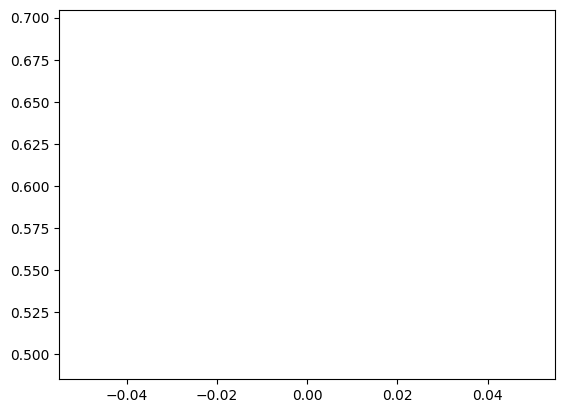

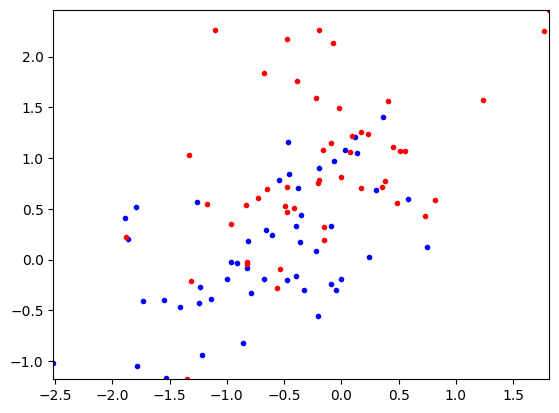

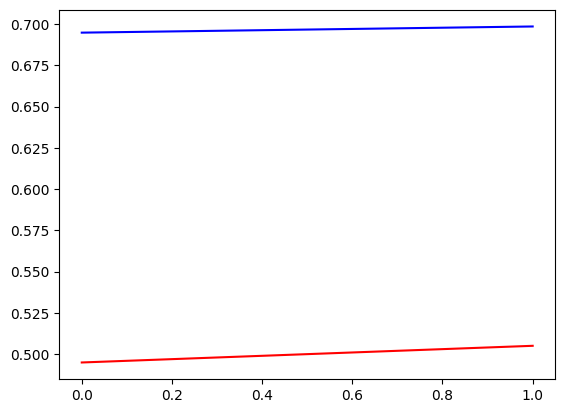

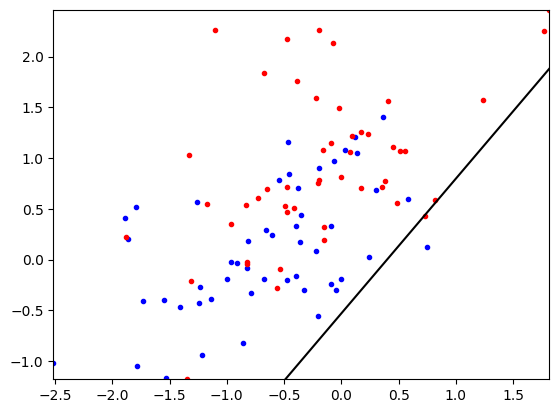

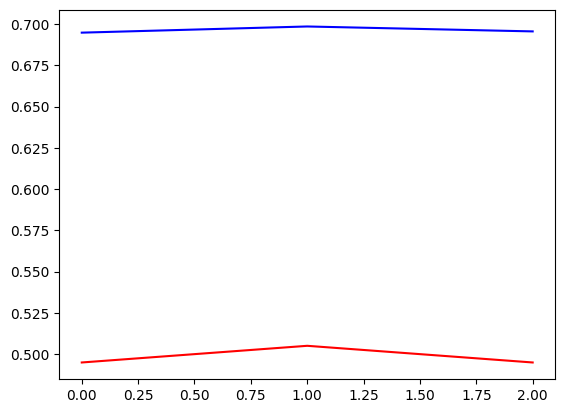

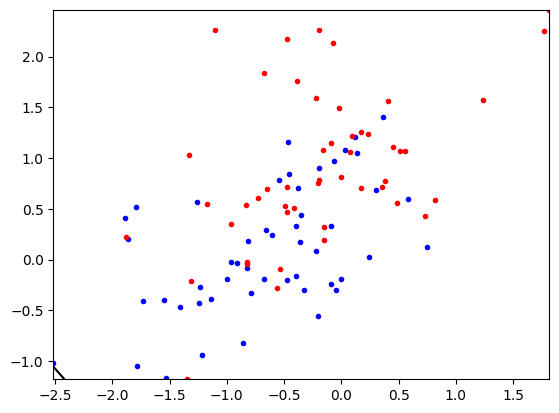

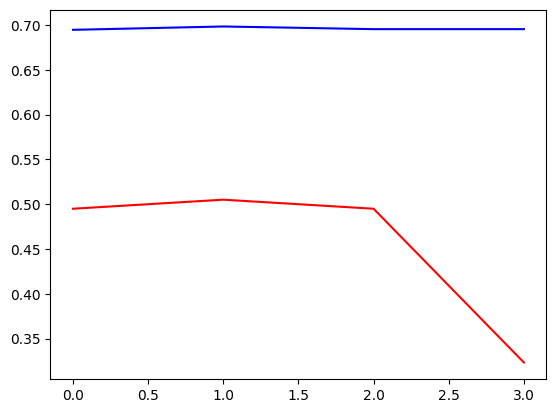

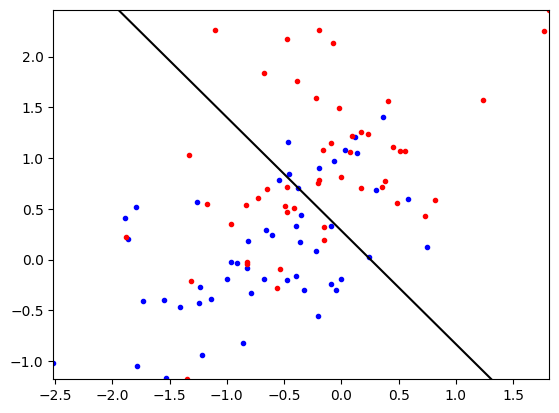

In [ ]:
classifierB.theta = np.array([0.,0.,0.]);
classifierB.train(XB,YB,initStep=1e-3,stopEpochs=2500,stopTol=1e-5,alpha=2)

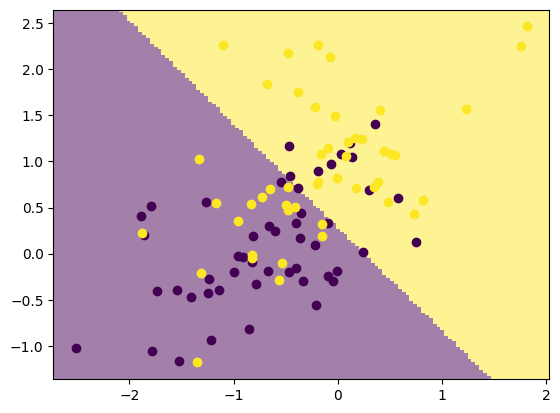

Training error rate:  0.32323232323232326


In [ ]:
ml.plotClassify2D(classifierB,XB,YB)
print("Training error rate: ",classifierB.err(XB,YB))
plt.show()

The L1 regularization term tries to mitigate the overfitting of data for the training dataset.Here as we see we have added the L1 regularization with alpha =2 ,the training error goes up as the model becomes more generalized.It tries to push the parameters towards zero and this can be useful to reduce the number of features by pushing them towards zero and reduce their importance.

9. Added an L2 regularization term (+α
 P
i
θ
2
i
) to the surrogate loss function, and updated the gradient

The L2 regularization term (+α
 P
i
θ
2
i
) is added to the surrogate loss function and the gradient of the regularization term is 2αθi


In [ ]:
def train(self, X, Y, initStep=1.0, stopTol=1e-4, stopEpochs=5000,alpha=0., plot=None):
        """ Train the logistic regression using stochastic gradient descent """
        M,N = X.shape;                     # initialize the model if necessary:
        self.classes = np.unique(Y);       # Y may have two classes, any values
        XX = np.hstack((np.ones((M,1)),X)) # XX is X, but with an extra column of ones
        YY = ml.toIndex(Y,self.classes);   # YY is Y, but with canonical values 0 or 1
        if len(self.theta)!=N+1: self.theta=np.random.rand(N+1);
        # init loop variables:
        epoch=0; done=False; Jnll=[]; J01=[];
        while not done:
            stepsize, epoch = initStep*2.0/(2.0+epoch), epoch+1; # update stepsize
            # Do an SGD pass through the entire data set:
            for i in np.random.permutation(M):
                ri    = XX[i].dot(self.theta)     # TODO: compute linear response r(x)
                sigmoid = 1/(1+np.exp(-ri))
                gradi = -(1-sigmoid)*XX[i,:] if YY[i] else sigmoid*XX[i,:]     # TODO: compute gradient of NLL loss
                gradi += 2.*alpha *self.theta  # Added L2 regularization to the gradient
                self.theta -= stepsize * gradi;  # take a gradient step

            J01.append( self.err(X,Y) )  # evaluate the current error rate

            ## TODO: compute surrogate loss (logistic negative log-likelihood)
            ##  Jsur = sum_i [ (log si) if yi==1 else (log(1-si)) ]
            Sigmoid = 1./(1.+np.exp(-(XX.dot(self.theta))))
            Jsur = -np.mean(YY*np.log(Sigmoid)+(1-YY)*np.log(1-Sigmoid))
            Jsur += alpha * np.sum(np.square(self.theta))  # Added L2 regularization to the loss function


            Jnll.append( Jsur ) # TODO evaluate the current NLL loss
            plt.figure(1); plt.plot(Jnll,'b-',J01,'r-'); plt.draw();    # plot losses
            if N==2: plt.figure(2); self.plotBoundary(X,Y); plt.draw(); # & predictor if 2D
            plt.pause(.01);                    # let OS draw the plot

            ## For debugging: you may want to print current parameters & losses
            # print self.theta, ' => ', Jnll[-1], ' / ', J01[-1]
            # raw_input()   # pause for keystroke

            # TODO check stopping criteria: exit if exceeded # of epochs ( > stopEpochs)
            done = epoch>=stopEpochs or (epoch>1 and abs(Jnll[-1]-Jnll[-2])<stopTol)  # or if Jnll not changing between epochs ( < stopTol )

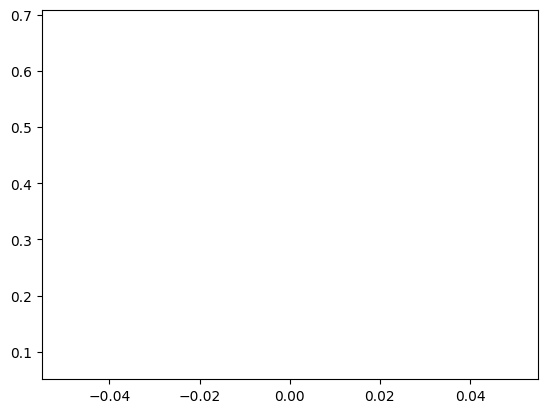

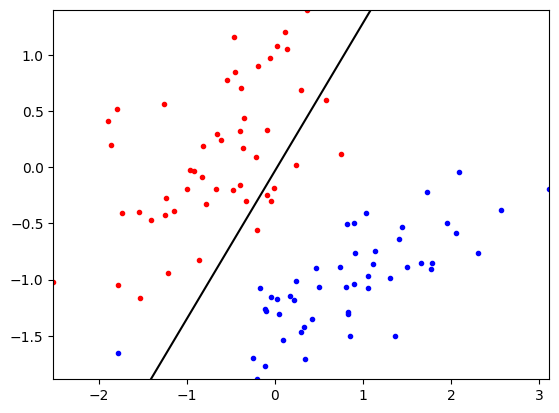

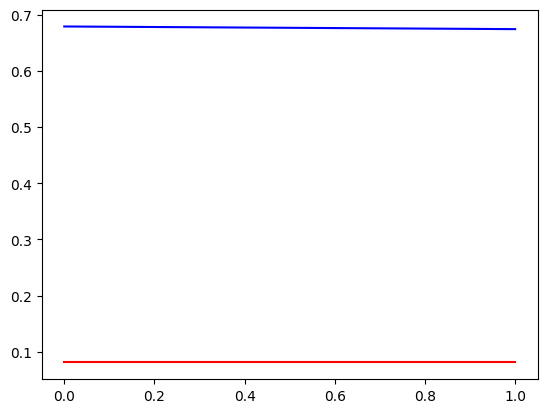

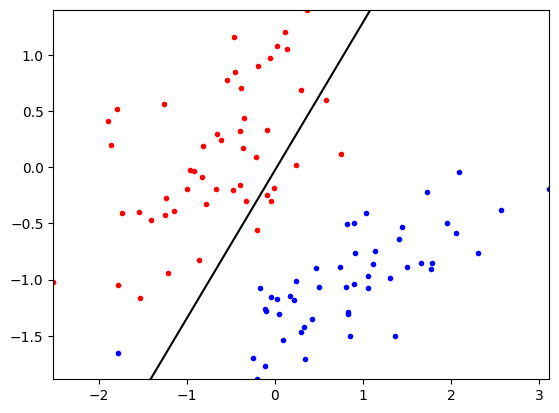

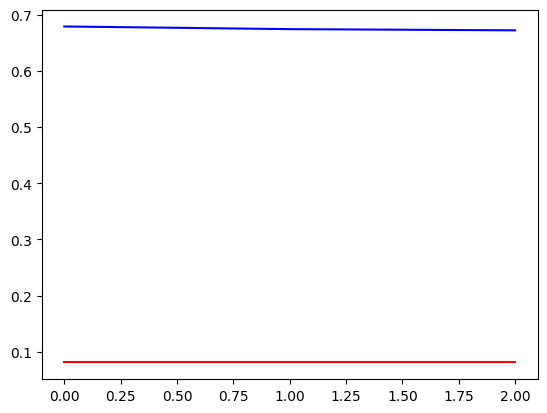

...

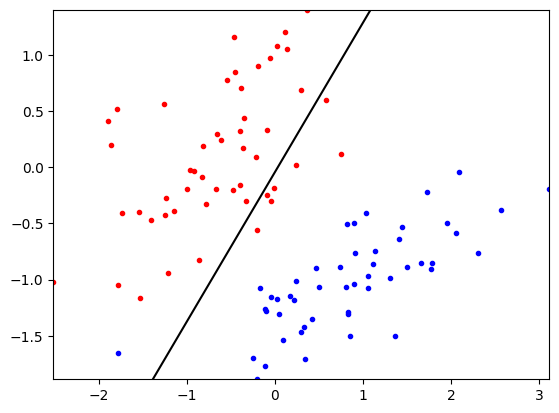

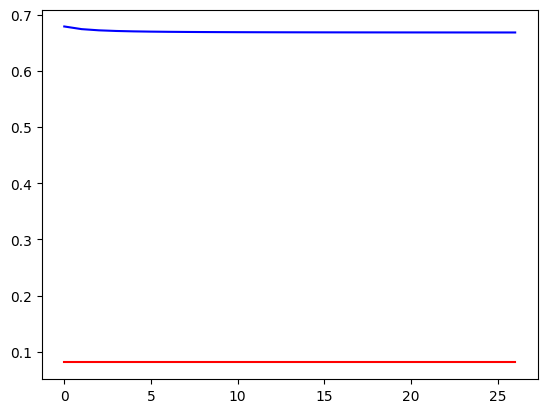

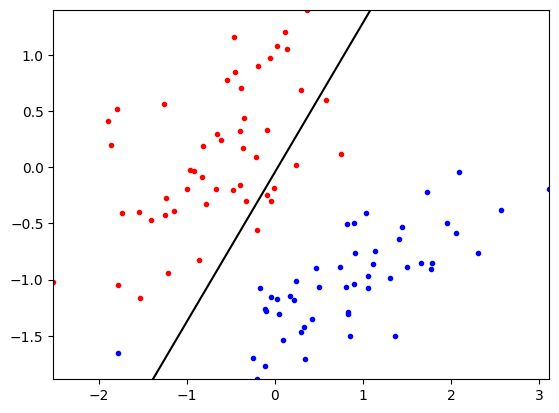

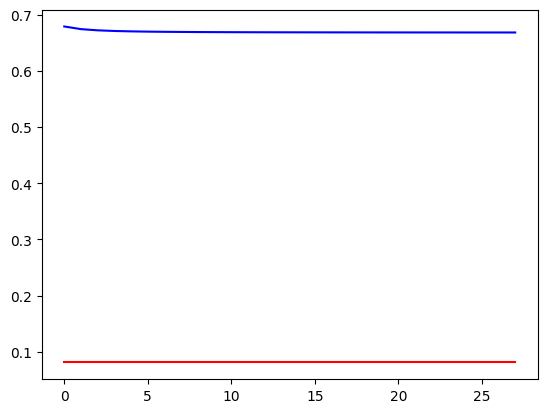

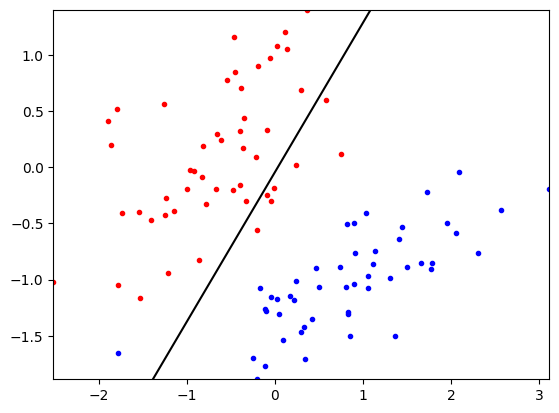

In [ ]:
classifierA.theta = np.array([0.,0.,0.]);
classifierA.train(XA,YA,initStep=1e-3,stopEpochs=2500,stopTol=1e-5,alpha=2)

/content/mltools/plot.py:61: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.
  axis.plot( X[Y==c,0],X[Y==c,1], 'ko', color=cmap(cvals[i]), **kwargs )


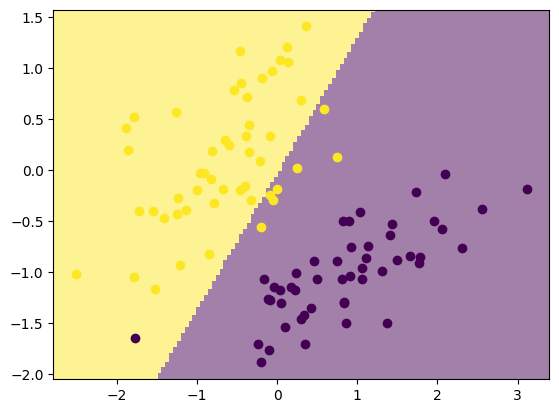

Training error rate:  0.08080808080808081


In [ ]:
ml.plotClassify2D(classifierA,XA,YA)
print("Training error rate: ",classifierA.err(XA,YA))
plt.show()

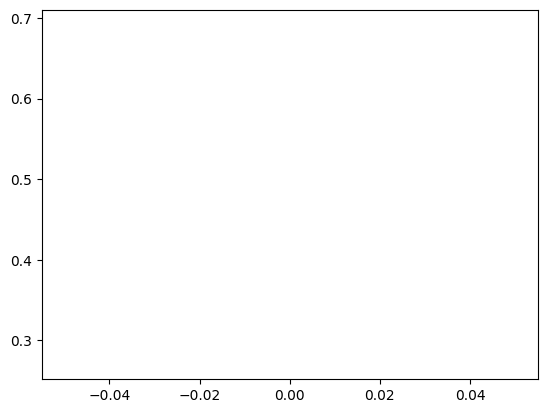

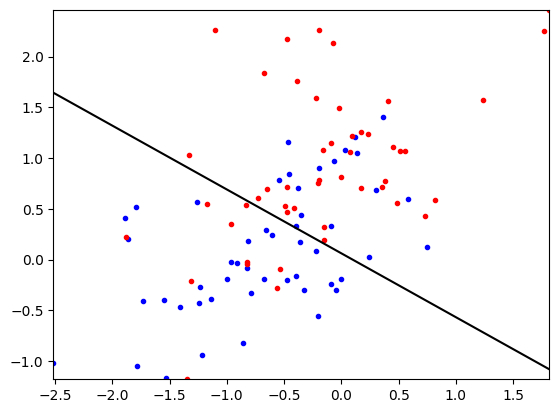

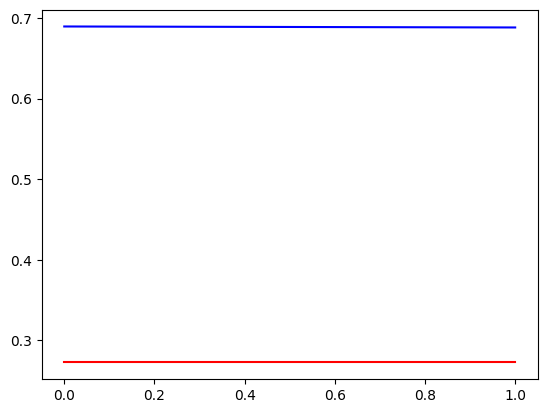

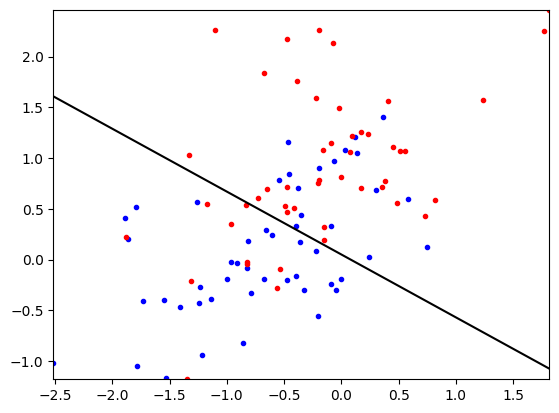

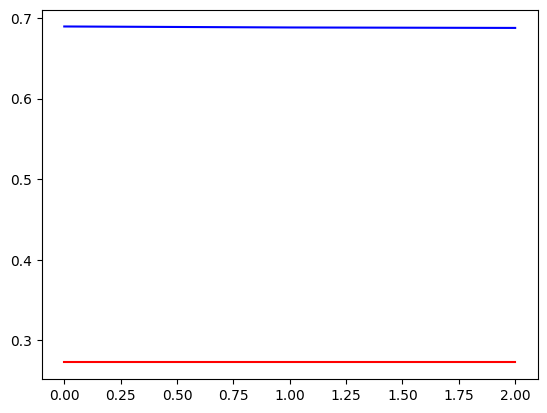

...

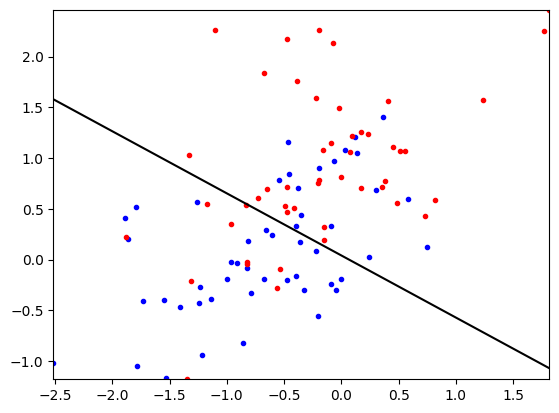

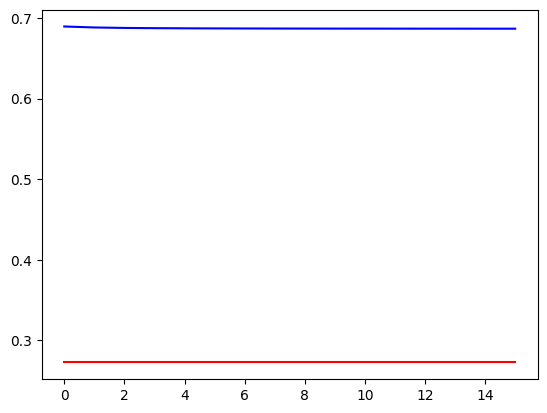

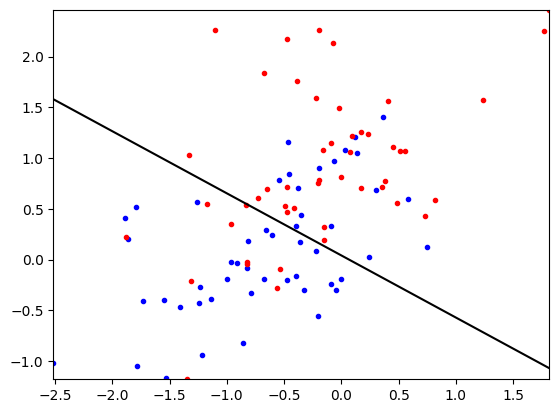

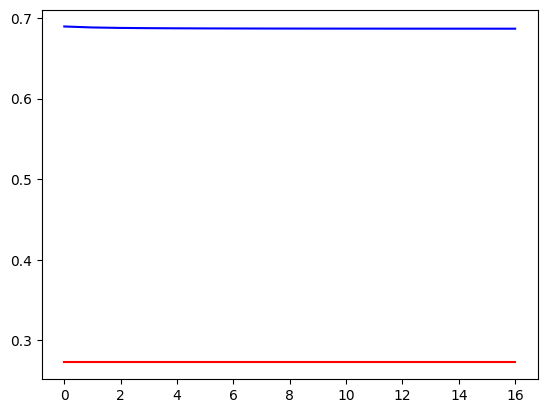

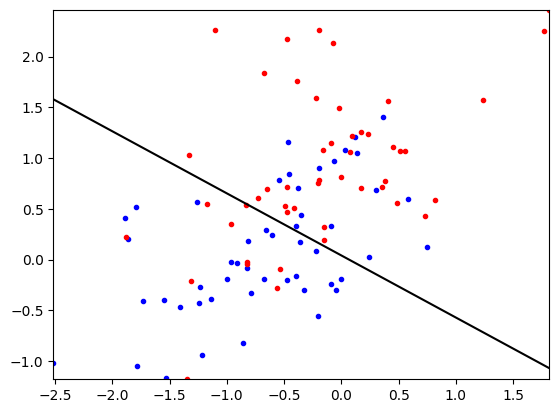

In [ ]:
classifierB.theta = np.array([0.,0.,0.]);
classifierB.train(XB,YB,initStep=1e-3,stopEpochs=2500,stopTol=1e-5,alpha=2)


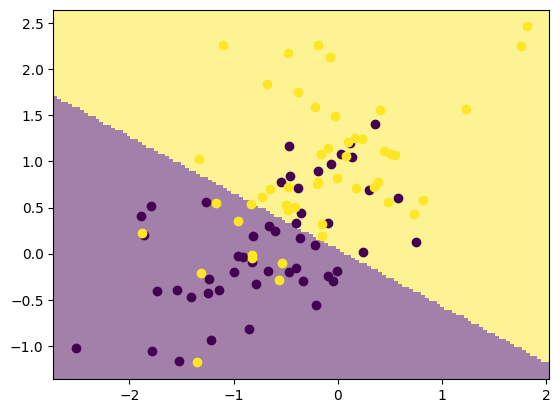

Training error rate:  0.2727272727272727


In [ ]:
ml.plotClassify2D(classifierB,XB,YB)
print("Training error rate: ",classifierB.err(XB,YB))
plt.show()

The L2 regularization term tries to mitigate the overfitting of data for the training dataset.Here as we see we have added the L2 regularization with alpha =2 ,the training error goes up as the model becomes more generalized.It tries to effectively penalize the larger parameter values.

The primary distinctions between L1 and L2 regularization are outlined below:

1) L1 regularization, also known as Lasso regularization, evaluates the absolute values of the model parameters, while L2 regularization, or Ridge regularization, assesses the squared values of the model parameters.

2) L1 regularization tends to reduce the coefficients of less significant features to zero, promoting sparsity within the model. This results in some parameters being precisely zero, effectively facilitating feature selection. On the other hand, L2 regularization penalizes large parameter values but seldom results in coefficients being precisely zero. Instead, it tends to distribute the influence of all features more evenly.

3) L1 regularization fosters sparsity, which can lead to more computationally efficient models, particularly in high-dimensional spaces, as it effectively conducts feature selection. Conversely, L2 regularization does not promote sparsity, potentially necessitating more computational resources, particularly in high-dimensional spaces.

4) L1 regularization corresponds to a diamond-shaped penalty region within the parameter space, with the corners of the diamond representing points where one or more parameters are zero. In contrast, L2 regularization corresponds to a spherical penalty region in the parameter space. It uniformly penalizes parameters and does not exhibit as strong a preference for sparsity as L1 regularization.

For this dataset ,it has only 2 features . It's not particularly high-dimensional, which may suggest that sparsity (encouraged by L1 regularization) may not be as critical compared to datasets with a larger number of features.Overly aggressive regularization might not be necessary. L2 regularization tends to distribute the impact of all features more evenly, which might be beneficial when dealing with a smaller and even dataset.Given these considerations, L2 regularization (Ridge regularization) might be more suitable for this dataset. It helps prevent overfitting by penalizing large parameter values without overly biasing the model towards any particular feature.